# SSD Tensorflow 2 Object Detection

In [1]:
from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
DATA_DIR = '/content/gdrive/My Drive/cv/datasets/test/images'

In [25]:
!cp -r '/content/gdrive/My Drive/cv/datasets/test/images' .

In [3]:
# Clone Tensorflow Models Repository
!git clone https://github.com/tensorflow/models.git

Cloning into 'models'...
remote: Enumerating objects: 87839, done.
remote: Counting objects: 100% (1551/1551), done.
remote: Compressing objects: 100% (661/661), done.
remote: Total 87839 (delta 975), reused 1406 (delta 875), pack-reused 86288
Receiving objects: 100% (87839/87839), 599.40 MiB | 30.16 MiB/s, done.
Resolving deltas: 100% (62873/62873), done.


In [4]:
# install Protobuf (for serialization)
!cd models/research/ && protoc object_detection/protos/*.proto --python_out=.

In [5]:
# Install the object detection API
!cd models/research && cp object_detection/packages/tf2/setup.py . && \
    python -m pip install .

Processing /content/models/research
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.7/14.7 MB 33.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 95.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.8/28.8 MB 57.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 13.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 78.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 4.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 241.2/241.2 kB 23.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.5/6.5 MB 37.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.7/89.7 kB 11.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... don

In [6]:
# Install libs
import os
import pathlib
import tensorflow as tf

import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

%matplotlib inline

In [7]:
# make sure we're using GPU
gpus = tf.config.experimental.list_physical_devices('GPU')
# Enable GPU dynamic memory allocation
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

In [8]:
!ls

drive  gdrive  models  sample_data


In [9]:
IMAGE_NAMES = ['bus.jpg', 'busTwo.jpg', 'stopFlip.jpg', 'stopSun.jpg', 'truckSnow.jpg', 'carsTraffic.jpg', 'intersection.jpg']

## Download the model

In [11]:
base_url = "http://download.tensorflow.org/models/object_detection/tf2/"
MODEL_DATE = '20200711'
MODEL_NAME = 'ssd_resnet152_v1_fpn_640x640_coco17_tpu-8'
MODEL_EXT  = '.tar.gz'
url = f"{base_url}{MODEL_DATE}/{MODEL_NAME}{MODEL_EXT}"

PATH_TO_MODEL_DIR = tf.keras.utils.get_file(
    fname=MODEL_NAME,
    origin=url,
    untar=True)

503650646/503650646 [==============================] - 2s 0us/step


In [12]:
PATH_TO_MODEL_DIR

'/root/.keras/datasets/ssd_resnet152_v1_fpn_640x640_coco17_tpu-8'

## Download the labels
Label files can be found here: https://github.com/tensorflow/models/tree/master/research/object_detection/data

(Object Detection Zoo contains only models trained on COCO.)

In [13]:
url = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/data/mscoco_label_map.pbtxt'

PATH_TO_LABELS = tf.keras.utils.get_file(
    fname='mscoco_label_map.pbtxt',
    origin=url,
    untar=False)

5056/5056 [==============================] - 0s 0us/step


In [14]:
PATH_TO_LABELS

'/root/.keras/datasets/mscoco_label_map.pbtxt'

In [15]:
# CHeck labels format
!head {PATH_TO_LABELS}

item {
  name: "/m/01g317"
  id: 1
  display_name: "person"
}
item {
  name: "/m/0199g"
  id: 2
  display_name: "bicycle"
}


## Load the model

In [16]:
PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR + "/saved_model"

print('Loading model...', end='')
start_time = time.time()

# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

Loading model...Done! Took 41.21312952041626 seconds


## Load the labels

In [17]:
category_index = label_map_util.create_category_index_from_labelmap(
    PATH_TO_LABELS,
    use_display_name=True)

## Putting it all together

In [18]:
## Helper function to load in images

def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
      path: the file path to the image

    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))

In [19]:
def detect_objects(image_path):
    print('Running inference for {}... '.format(image_path), end='')

    image_np = load_image_into_numpy_array(image_path)

    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image_np)

    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]

    # Do the detection
    detections = detect_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                   for key, value in detections.items()}
    detections['num_detections'] = num_detections

    # detection_classes should be ints.
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

    # show classes
    # unique_classes = set(detections['detection_classes'])
    # print("Classes found:")
    # for c in unique_classes:
    #     print(category_index[c]['name'])

    image_np_with_detections = image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          detections['detection_boxes'],
          detections['detection_classes'],
          detections['detection_scores'],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=200,
          min_score_thresh=.30,
          agnostic_mode=False)

    plt.figure(figsize=(15, 10))
    plt.imshow(image_np_with_detections)
    print('Done')
    plt.show()

Running inference for bus.jpg... 
Running inference for images/bus.jpg... Done


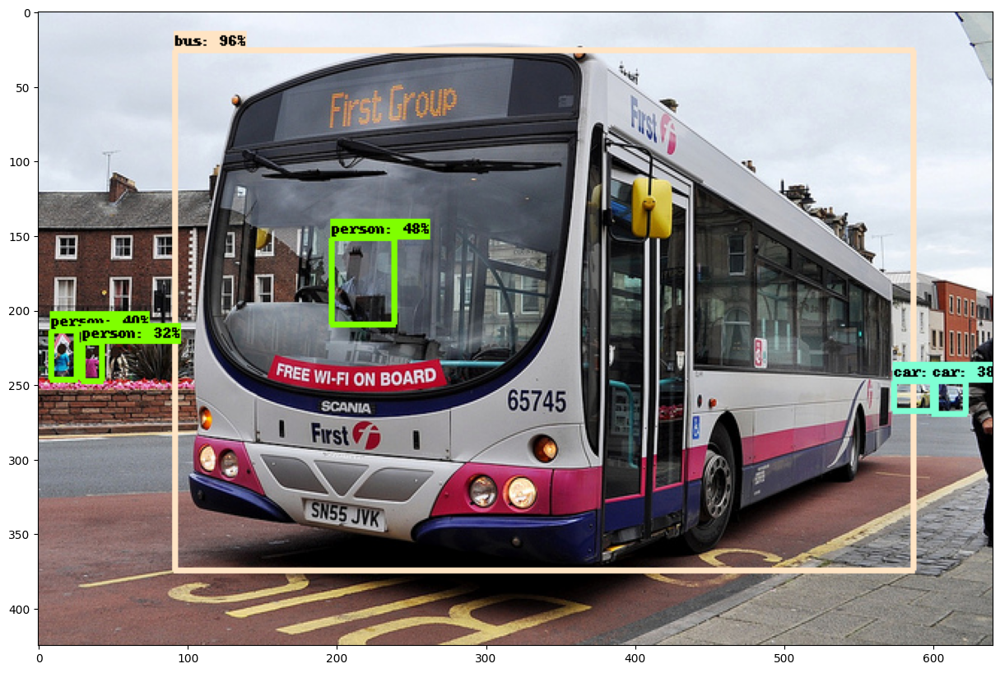

Running inference for busTwo.jpg... 
Running inference for images/busTwo.jpg... Done


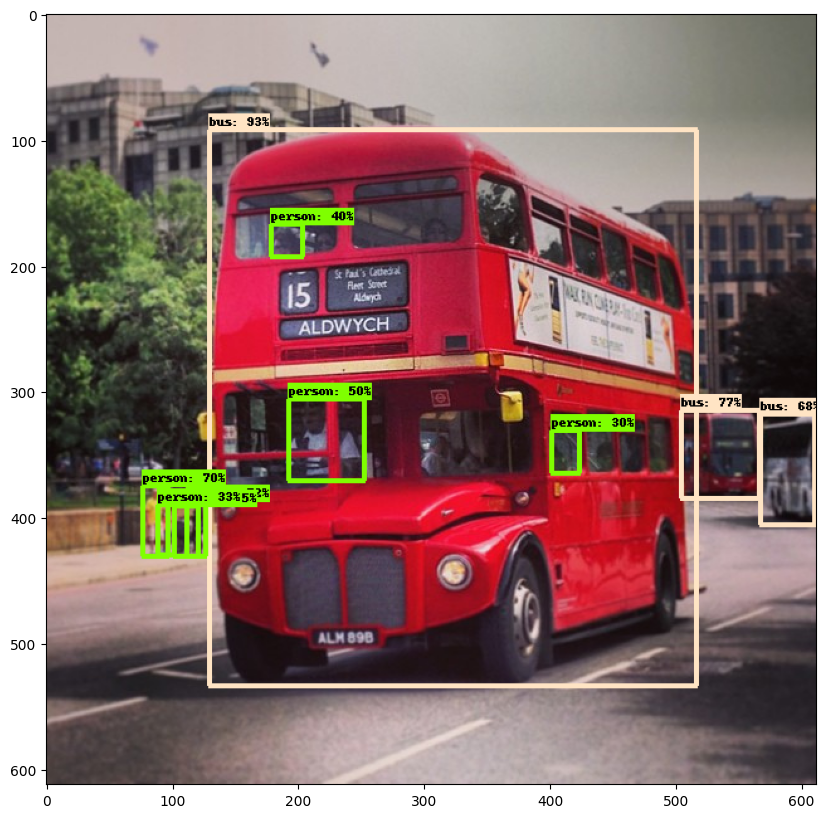

Running inference for stopFlip.jpg... 
Running inference for images/stopFlip.jpg... Done


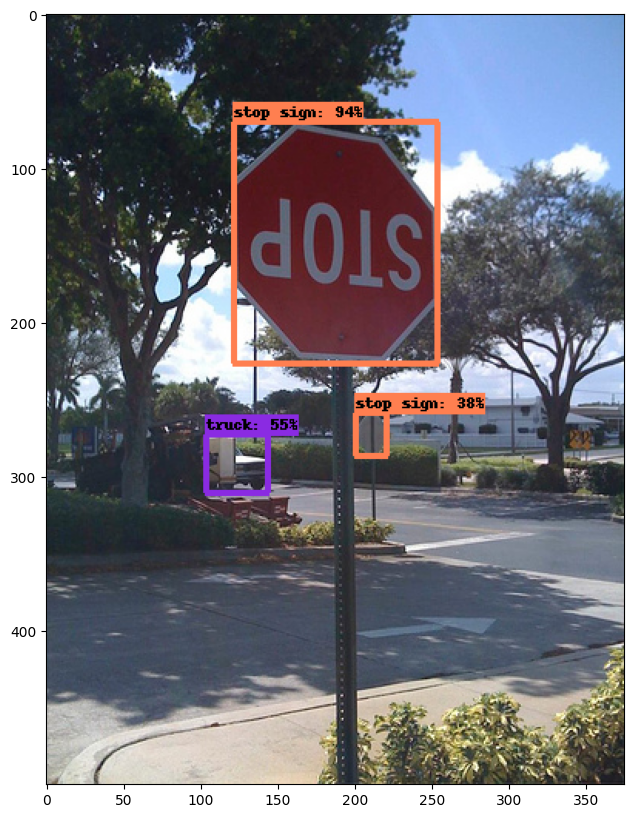

Running inference for stopSun.jpg... 
Running inference for images/stopSun.jpg... Done


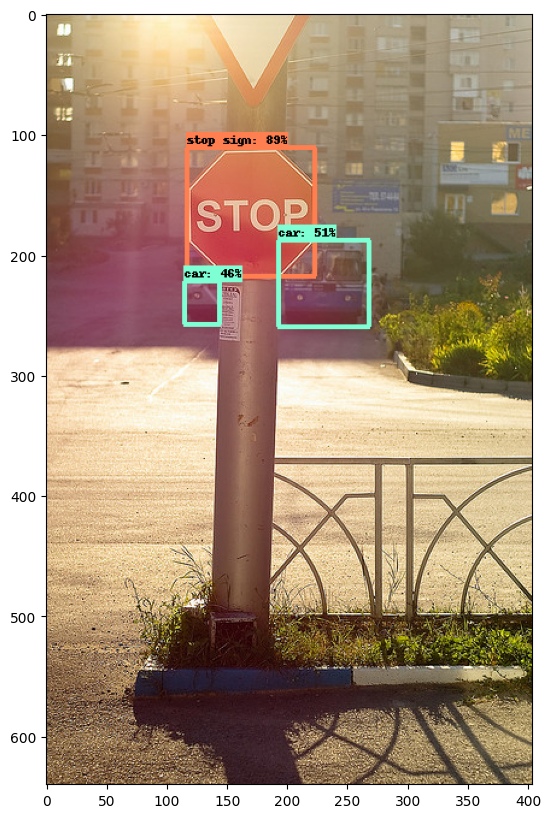

Running inference for truckSnow.jpg... 
Running inference for images/truckSnow.jpg... Done


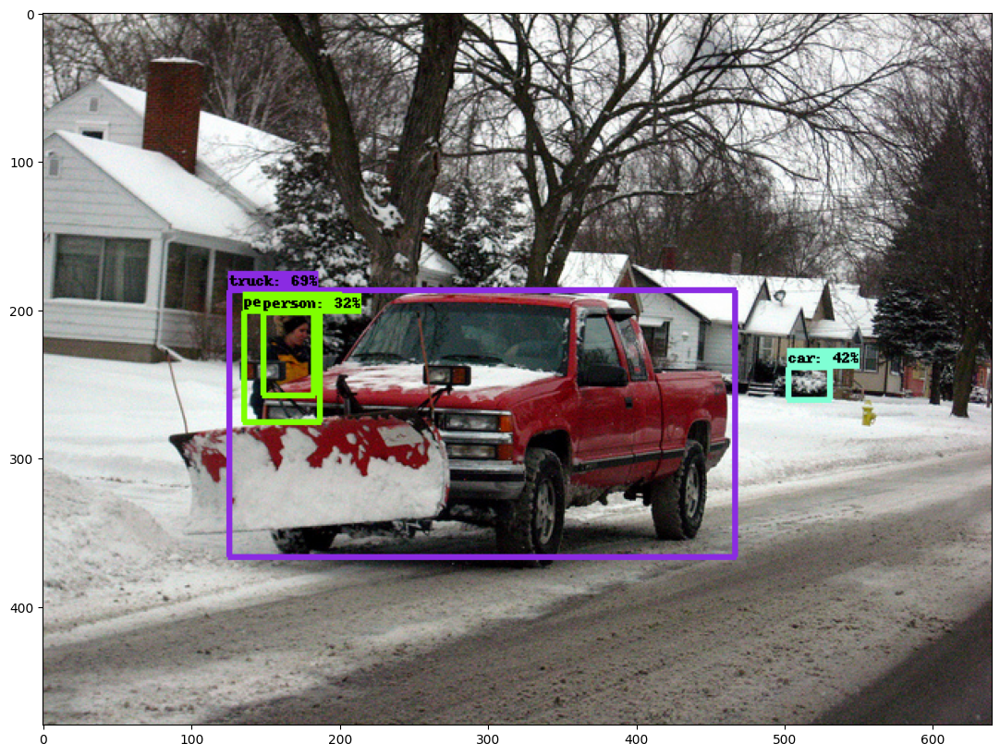

Running inference for carsTraffic.jpg... 
Running inference for images/carsTraffic.jpg... Done


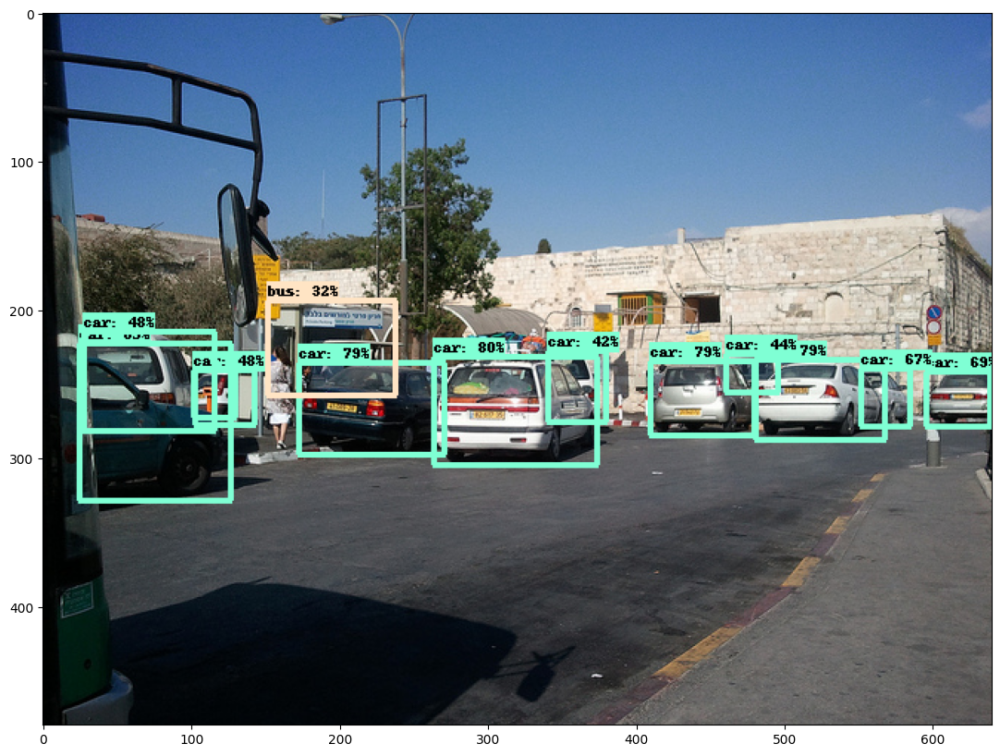

Running inference for intersection.jpg... 
Running inference for images/intersection.jpg... Done


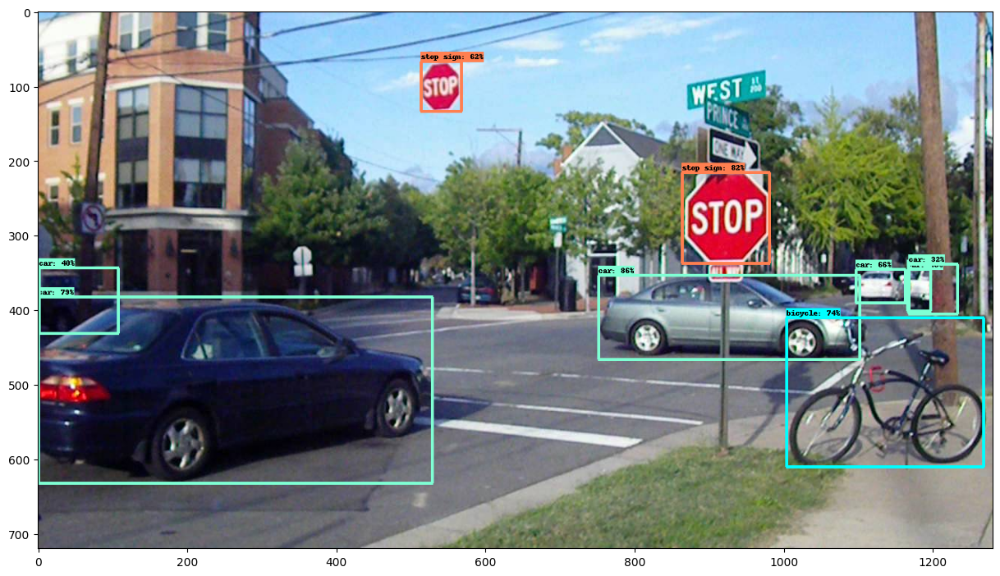

In [27]:
for i,image in enumerate(IMAGE_NAMES):
    print('Running inference for {}... '.format(image))
    detect_objects(f'images/{IMAGE_NAMES[i]}')